### 모양 감지
- 윤곽선 추출
- 이미지 모멘트
- 다각형 근사

In [1]:
import cv2
import numpy as np
from PIL import Image

def show(image):
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return Image.fromarray(rgb)

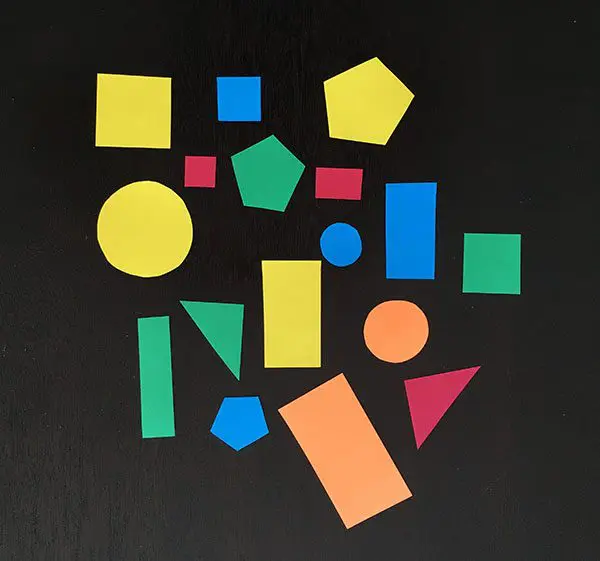

In [4]:
# 전처리
image_path = '../data/shapes.webp'
image = cv2.imread(image_path)
show(image)

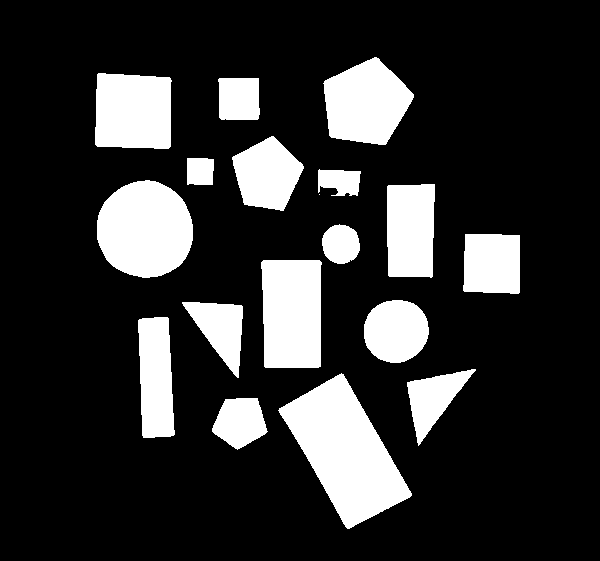

In [5]:
# 흑백 이미지로 변환
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# 7x7 커널로 가우시안 블러링
blurred = cv2.GaussianBlur(gray, (7, 7), 0)

# OTSU 이진화
th, bin = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

# 보기
Image.fromarray(bin)

In [7]:
# 윤곽선 추출
# 검은 색 배경에서 하얀색 물체의 윤곽선을 추출
# cv2.findContours: 이미지에서 같은 밝기를 가진 연속된 점들을 찾아 하나의 덩어리로 묶는 역할
contours, hierarchy = cv2.findContours(bin.copy(), # 이미지, non-zero 픽셀을 객체로 간주
                                       cv2.RETR_EXTERNAL, # 윤곽선 검출 모드
                                       cv2.CHAIN_APPROX_SIMPLE) # 윤곽선 근사화 방법
                                                                # (SIMPLE: 꼭지점만, NONE: 모든 점)
# contours: 검출된 윤곽선 좌표, 각 배열은 하나의 닫힌 도형(객체)을 구성하는 좌표들을 담음
# hierarchy: 물체가 중첩되어 있을 때 부모-자식 관계를 나타내는 배열(1, N, 4 형태의 행렬)
#            [Next, Previous, First_Child, Parent]

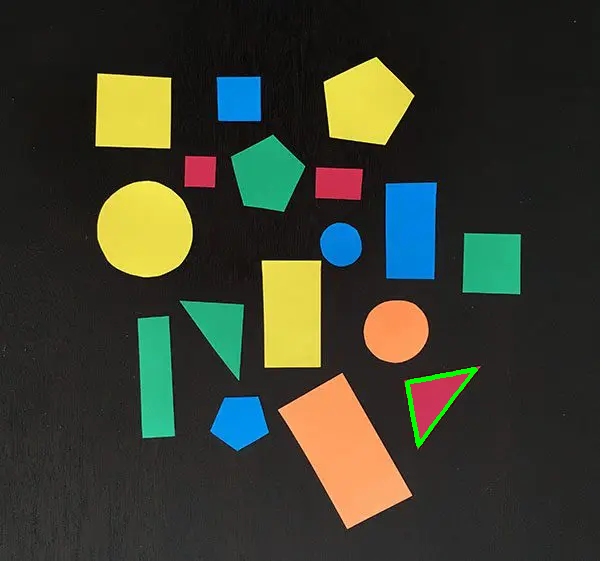

In [8]:
# 윤곽선 그리기
contoured_image = image.copy() # 이미지 복사
i = 2 # 2번 도형
color = 0, 255, 0 # green
thickness = 3 # 두께
show(cv2.drawContours(contoured_image, contours, i, color, thickness))

In [9]:
# 이미지 모멘트
# 이미지의 픽셀 분포에 대한 가중치 평균(x*y*I((x, y)의 밝기)의 평균)
# m00: 모든 점의 밝기의 합 == 면적
M = cv2.moments(contours[i]) # 모멘트 계산
cX = int(M["m10"] / M["m00"]) # x좌표의 무게 중심
cY = int(M["m01"] / M["m00"]) # y좌표의 무게 중심

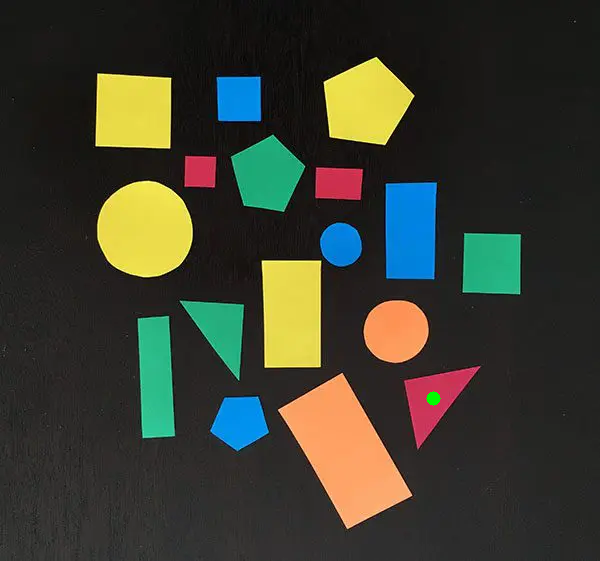

In [10]:
# 무게중심 그리기
dst = image.copy()
center_color = 0, 255, 0 # green
no_stroke = -1 # 테두리 없음
radius = 7 # 반지름
show(cv2.circle(dst, (cX, cY), radius, center_color, no_stroke))

### Ramer-Douglas-Peucker 알고리즘
- 윤곽선을 다각형으로 근사
- cv.approxPolyDP()

### 근사 방법
- 허용오차를 벗어나는 점 = 새로운 꼭짓점 -> 남김
- 허용오차에 포함 = 다각형의 변에 있는 점 -> 지움

In [11]:
# 다각형으로 근사
c = contours[i] # 곡선
peri = cv2.arcLength(c, True) # 둘레 길이(True: 폐곡선 여부)
approx = cv2.approxPolyDP(c, # 곡선
                          0.02 * peri, # 허용 오차
                          True) # 폐곡선 여부
n = len(approx) # n각형
n

3

### 신분증 스캔
1. 가장 큰 사각형 찾기
2. 투시 변환

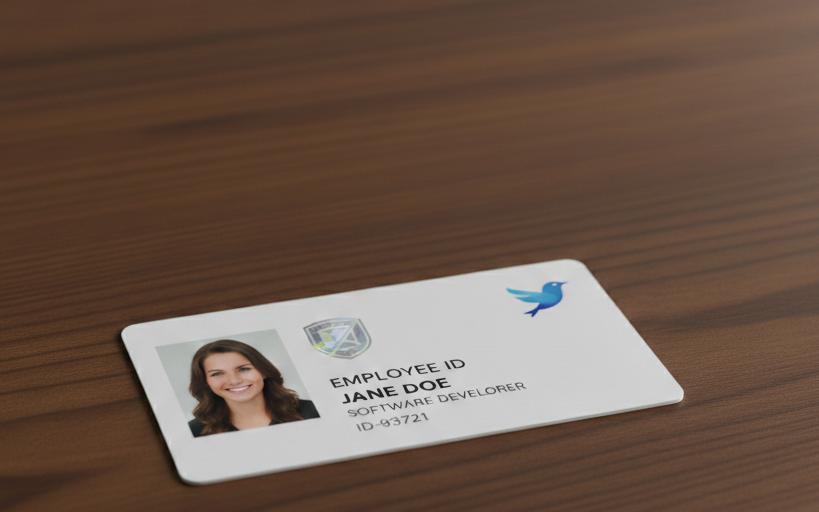

In [12]:
# 이미지 파일 불러오기
image = cv2.imread('../data/id_card.png')
show(image)

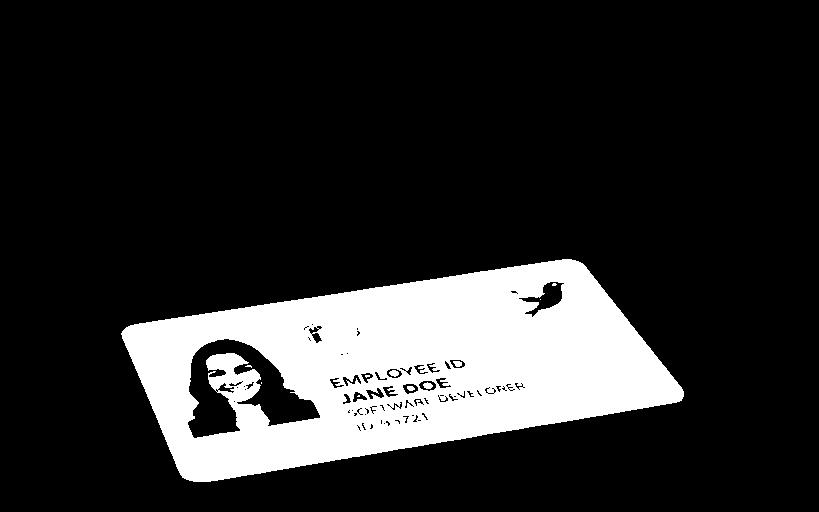

In [14]:
# 오츠의 이진화
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
show(binary)

In [15]:
# 윤곽선 추출
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# 가장 큰 사각형 찾기
biggest_rect = None
for contour in contours:
    epsilon = 0.02 * cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, epsilon, True) # 다각형으로 근사
    # 사각형인지 확인하고 넓이 비교
    if len(approx) == 4 and \
      biggest_rect is None or cv2.contourArea(approx) > cv2.contourArea(biggest_rect):
        biggest_rect = approx

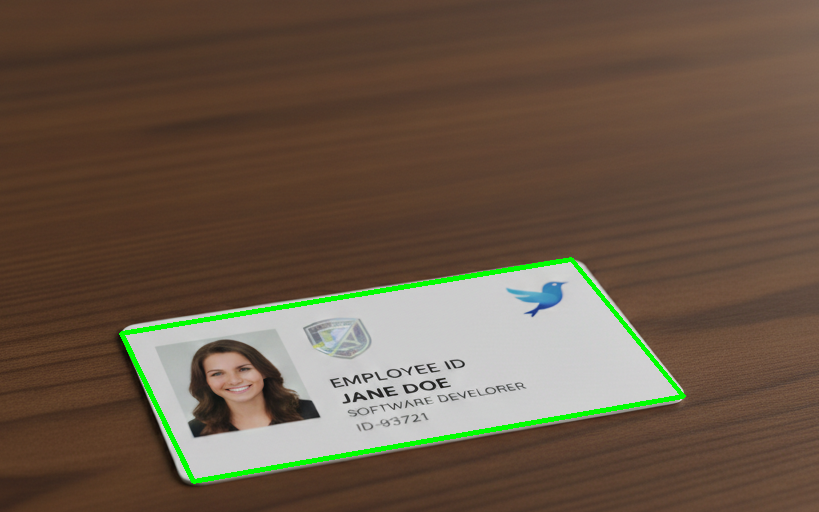

In [27]:
# 윤곽선 그리기
contoured_image = image.copy() # 이미지 복사
show(cv2.drawContours(contoured_image, [biggest_rect], -1, (0, 255, 0), 3))

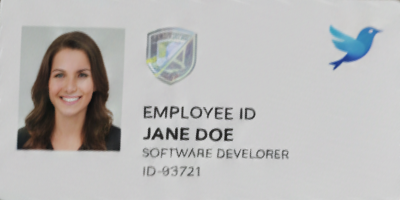

In [28]:
# 투시 변환
sorted_corners = sorted(biggest_rect.tolist()) # 꼭지점 정렬

pts1 = np.float32(sorted_corners)# 원본의 점 4개
pts2 = np.float32([[0, 0], [0, 200], [400, 0], [400, 200]]) # 변환될 점 4개

matrix = cv2.getPerspectiveTransform(pts1, pts2)
result = cv2.warpPerspective(image, matrix, (400, 200)) # 투시 변환
show(result)

### 볼록 껍질(Convex Hull)
- 어떤 도형을 둘러싼 볼록한 다각형 찾기

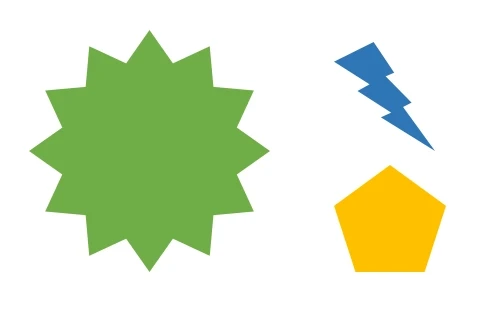

In [29]:
src = cv2.imread("../data/convex.webp")
show(src)

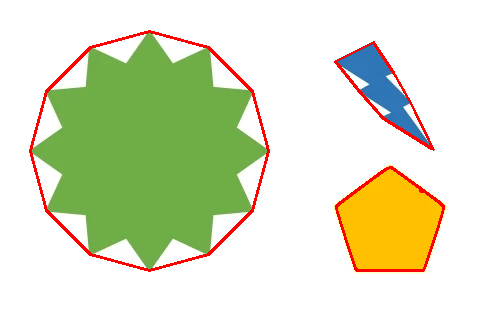

In [30]:
dst = src.copy()

# 윤곽선 추출
gray = cv2.cvtColor(src, cv2.COLOR_RGB2GRAY)
ret, binary = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY_INV) # 이진화
contours, hierarchy = cv2.findContours(binary, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_NONE)

for i in contours:
    hull = cv2.convexHull(i, clockwise=True) # 볼록 껍질 찾기(True: 시계 방향)
    cv2.drawContours(dst, [hull], 0, (0, 0, 255), 2)

show(dst)

### 배경색을 이용해 자르기

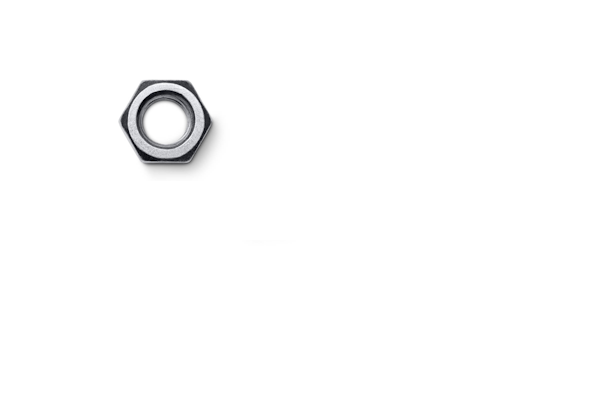

In [31]:
# 배경색과 유사한 부분을 마스킹하여 실제 객체가 있는 부분만 자릅니다.
src = cv2.imread('../data/nut.png')
show(src)

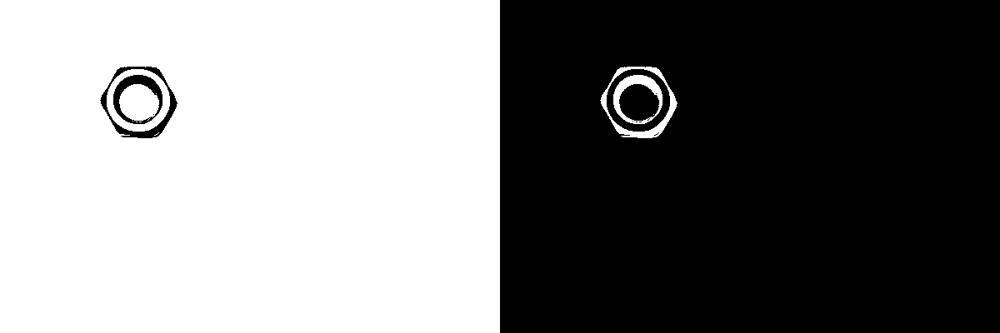

In [39]:
bg_color = src[0, 0] # 왼쪽 상단 픽셀 색상 (배경색으로 가정)

# 허용 색상 범위
error = 100
low = np.where(bg_color > error, bg_color - error, 0)
high = np.where(bg_color < 255 - error, bg_color + error, 255)

mask = cv2.inRange(src, low, high) # 배경색과 유사한 색상 검출
mask_inv = cv2.bitwise_not(mask) # 배경색이 아닌 부분 검출

show(np.concatenate([mask, mask_inv], axis=1))

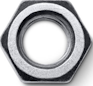

In [40]:
coords = cv2.findNonZero(mask_inv) # 실제 그림이 있는 좌표 추출
x, y, w, h = cv2.boundingRect(coords) # 사각형으로 경계 추출

trimmed = src[y:y+h, x:x+w] # 실제 그림 부분만 자름
show(trimmed)

### 직선 검출
1. 윤곽선 추출
2. 멀티 스케일 허프 변환

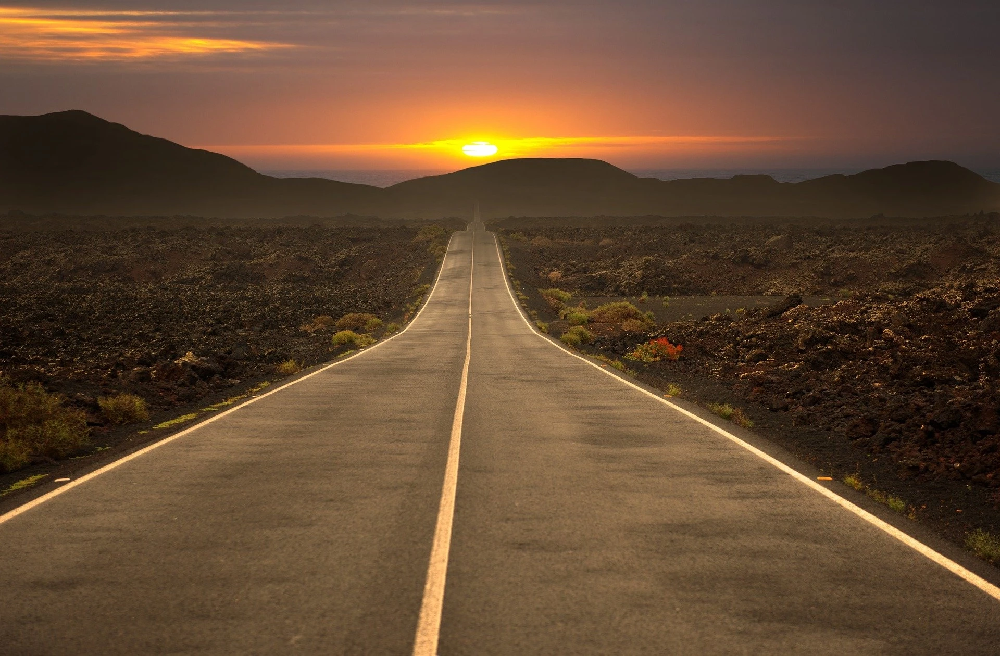

In [50]:
src = cv2.imread("../data/road.webp")
show(src)

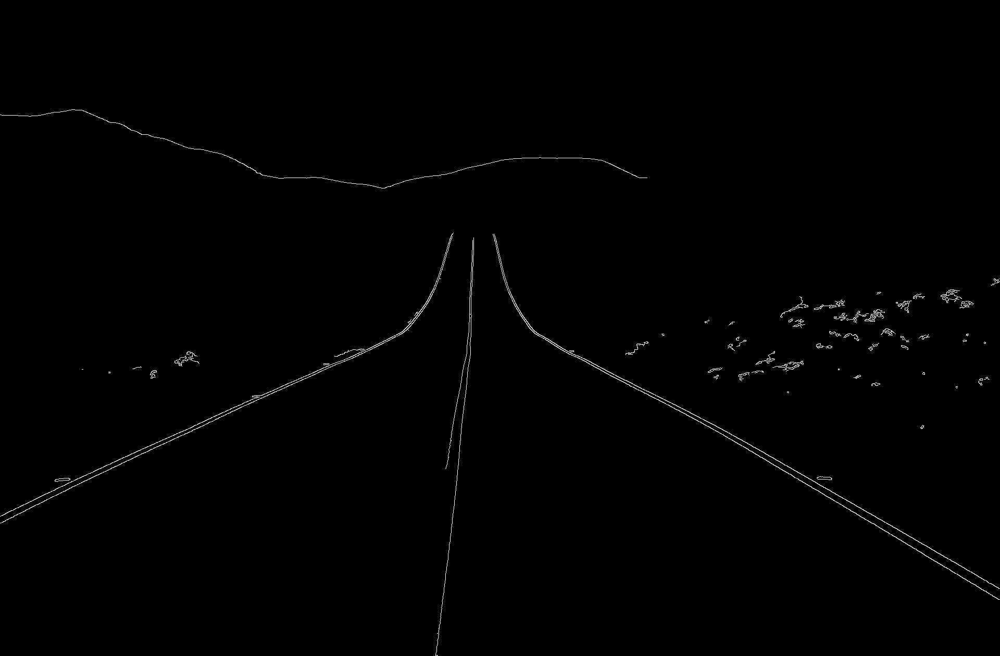

In [51]:
# 윤곽선 추출
gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
canny = cv2.Canny(gray, 5000, 1500, apertureSize = 5, L2gradient = True)
show(canny)

In [52]:
# 멀티 스케일 허프 변환
# 허프 변환:
# 1. 윤곽선을 이루는 점들을 지나는 직선의 방정식을 찾고
# 2. 가장 조건에 맞는 직선들만 골라냄
lines = cv2.HoughLines(canny,
                       0.8, # 거리 측정 해상도, 0 ~ 1
                       np.pi / 180, # 각도의 해상도(라디안)
                       150, # 임계값(최소 몇 개의 점이 일직선상에 있어야 직선으로 인정할지, 값이 클수록 정확도 증가, 검출되는 직선의 수는 감소)
                       srn = 100, # 거리의 약수(≥0), 허프 변환을 좀 더 정확하게 하기 위한 값
                       stn = 200, # 각도의 약수(≥0), 허프 변환을 좀 더 정확하게 하기 위한 값
                       min_theta = 0, # 최소 각도
                       max_theta = np.pi) # 최대 각도

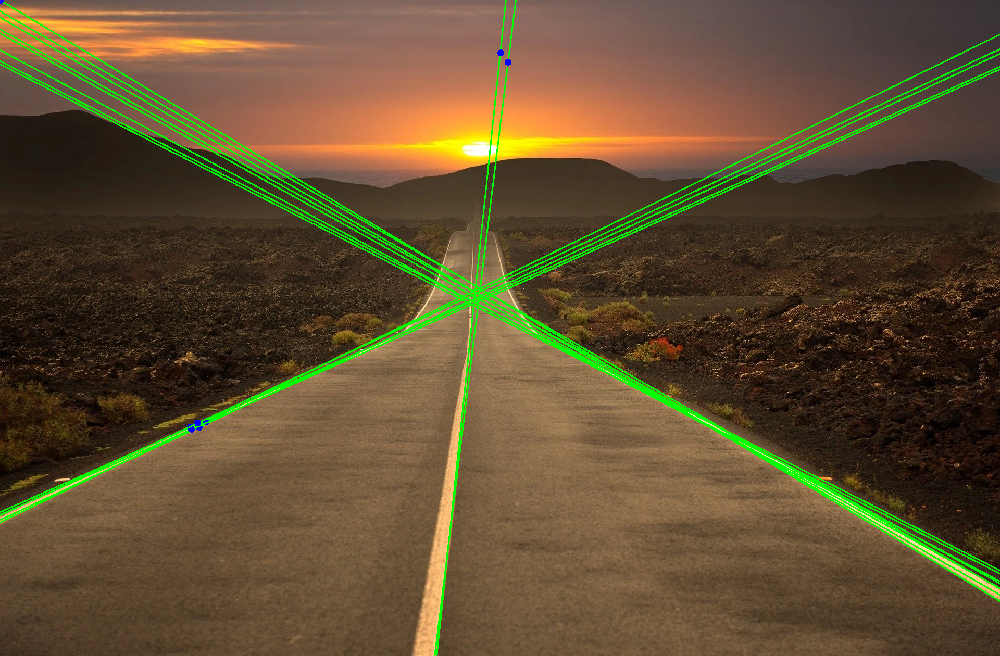

In [54]:
# 직선 검출 시각화
dst = src.copy()

for i in lines:
    # rho + theta 형식의 직선을 x, y 형식의 직선으로 변환
    rho, theta = i[0][0], i[0][1]
    a, b = np.cos(theta), np.sin(theta)
    x0, y0 = int(a*rho), int(b*rho)
    scale = src.shape[0] + src.shape[1]
    x1 = int(x0 + scale * -b)
    y1 = int(y0 + scale * a)
    x2 = int(x0 - scale * -b)
    y2 = int(y0 - scale * a)
    
    # 직선 그리기
    cv2.line(dst, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.circle(dst, (x0, y0), 3, (255, 0, 0), 5, cv2.FILLED)

show(dst)

In [56]:
# 점진성 확률적 허프 변환: 속도는 빠르지만 정확성은 떨어지는 방식
lines = cv2.HoughLinesP(canny,
                        0.8,  # 거리 측정 해상도, 0 ~ 1
                        np.pi / 180, # 각도의 해상도(라디안)
                        90, # 임계값(키울 수록 정확도 증가하고 검출되는 직선의 수는 감소)
                        minLineLength = 10,  # 검출할 직선의 최소 길이
                        maxLineGap = 100) # 최대 허용 간격(이 간격 내에 있는 직선은 검출 안함)

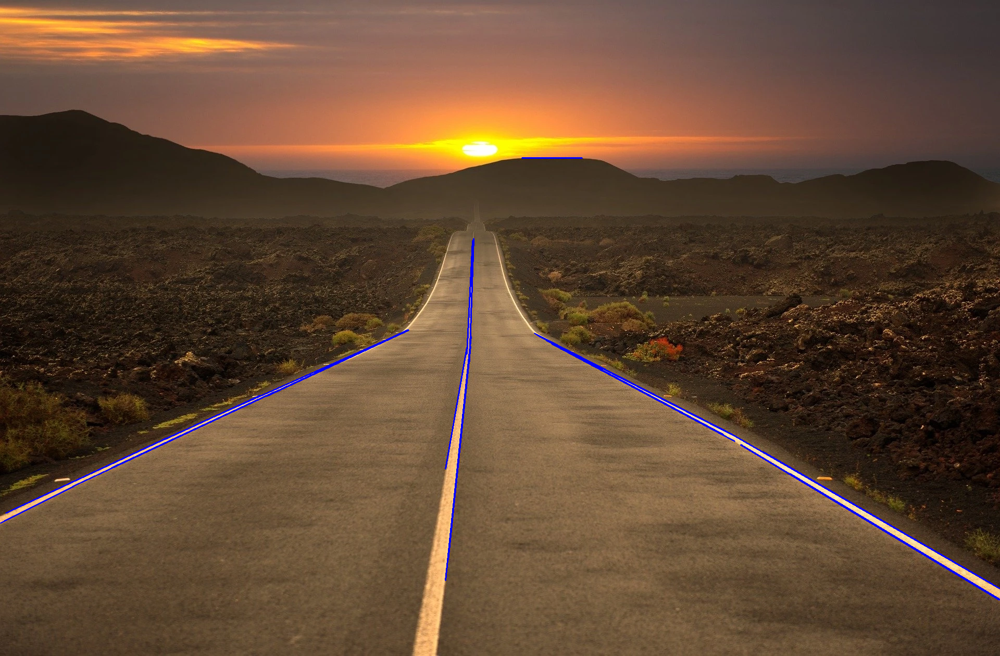

In [60]:
# 직선 검출 시각화
dst = src.copy()

lines = lines.astype(int, copy=False)
for i in lines:
    # (dst, 시작, 끝, 색깔, 굵기)
    cv2.line(dst, (i[0][0], i[0][1]), (i[0][2], i[0][3]), (255, 0, 0), 2)

show(dst)

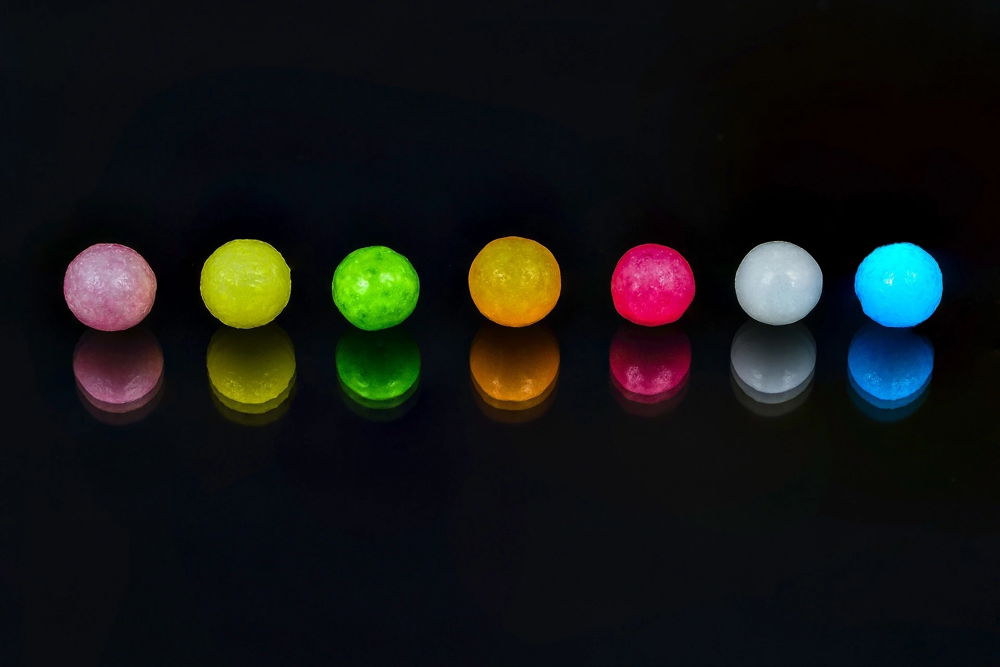

In [62]:
# 원 검출
src = cv2.imread("../data/balls.webp") # 예제 이미지
show(src)

In [63]:
gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)

# 허프 변환
circles = cv2.HoughCircles(gray, 
                           cv2.HOUGH_GRADIENT, # 검출 방법, HOUGH_GRADIENT_ALT도 있음
                           1, # 해상도 비율
                           100, # 원의 중심 간 최소 거리
                           param1 = 250, # 검출 방법의 매개 변수
                           param2 = 10, # 검출 방법의 매개 변수
                           minRadius = 80, # 최소 반지름
                           maxRadius = 120) # 최대 반지름

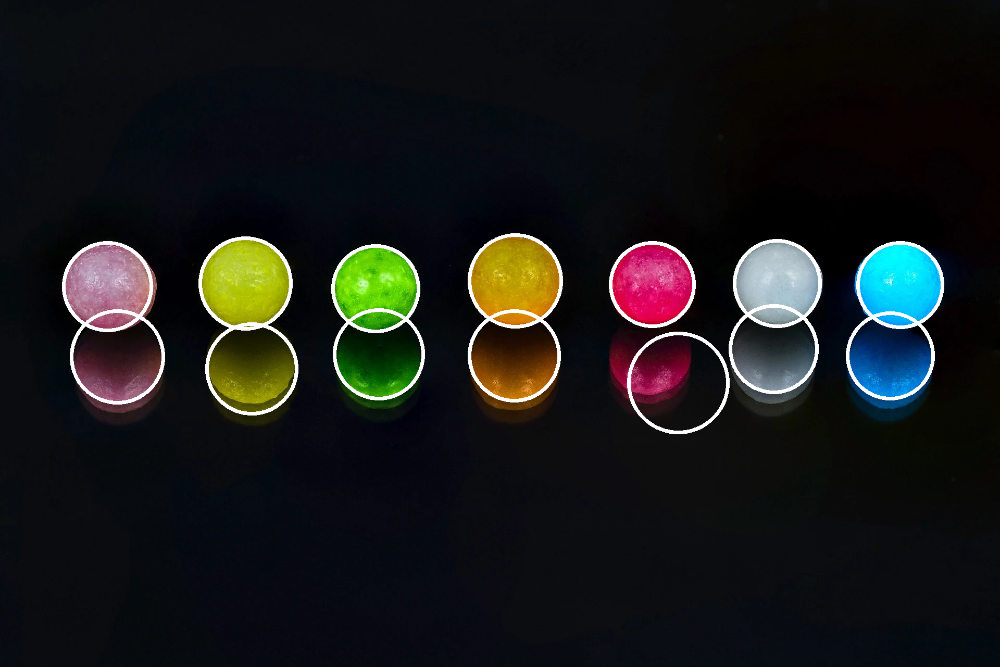

In [64]:
# 원 검출 시각화
dst = src.copy()
circles = circles.astype(int)
for i in circles[0]:
    cv2.circle(dst, (i[0], i[1]), i[2], (255, 255, 255), 5)

show(dst)